In [23]:
%load_ext autoreload
%autoreload 2

import random
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch.nn as nn
import torch.optim as optim

import sys
sys.path.append('../src/')
from simple_transformer import MultilayerTransformer, initialize_weights, train_model, train_hooked_model
from markov_utilities import (
    calculate_sequence_probabilities,
    compute_myopic_entropy_from_MSP,
    epsilon_machine_to_graph,
    get_recurrent_subgraph,
    to_mixed_state_presentation,
    get_recurrent_subgraph,
    calculate_empirical_sequence_probabilities,
    create_transition_matrix,
    to_probability_distributions
)


from entropy_analysis import (
    compute_conditional_entropy,
    compute_empirical_conditional_entropy,
    inverse_binary_entropy,

)

from error_analysis import (
    compute_minimum_error,
)



from visualization import visualize_graph
from processes import RRXORProcess, GoldenMeanProcess, ZeroOneRProcess, EvenProcess, Mess3Process


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
[0.55 1.   0.55] [[-0.81649658  0.57735027  0.16048579]
 [ 0.40824829  0.57735027 -0.77355612]
 [ 0.40824829  0.57735027  0.61307033]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


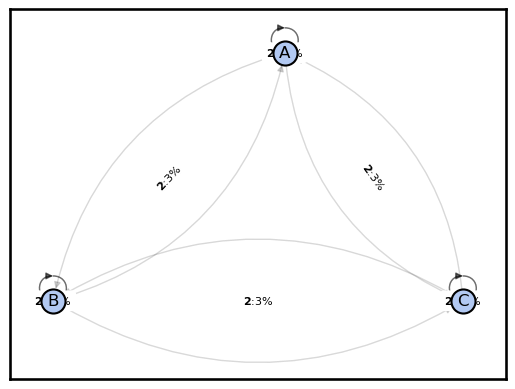

In [24]:
Z1R = Mess3Process()

# visualize the epsilon machine
graph = epsilon_machine_to_graph(Z1R.T, Z1R.state_names)
visualize_graph(graph, layout="spectral", draw_mixed_state=True, pdf="zero_one_r_epsilon.pdf")


In [25]:
MSP = to_mixed_state_presentation(Z1R.T, threshold=1e-5, max_depth=8)
#G_MSP = epsilon_machine_to_graph(MSP)
#visualize_graph(G_MSP, layout='spring', draw_edge_labels=True,
#                                    draw_mixed_state=True, draw_color=False, pdf="zero_one_r_msp.pdf")

[[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
[0.55 1.   0.55] [[-0.81649658  0.57735027  0.16048579]
 [ 0.40824829  0.57735027 -0.77355612]
 [ 0.40824829  0.57735027  0.61307033]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


Text(0.5, 1.0, '01R) Myopic Entropy')

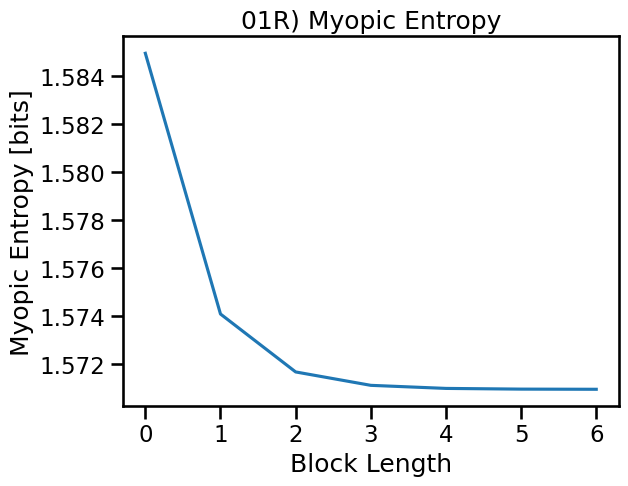

In [26]:
# myopic entropy
plt.plot(compute_myopic_entropy_from_MSP(MSP,7))
plt.ylabel('Myopic Entropy [bits]'); plt.xlabel('Block Length'); plt.title('01R) Myopic Entropy')

In [27]:
from transformer_lens import HookedTransformer, HookedTransformerConfig

config = HookedTransformerConfig(
    d_model=64,
    d_head=4,
    n_layers=10,
    n_ctx=7,
    n_heads=18,
    d_mlp=4*64,
    d_vocab=3,
    act_fn='relu',
    use_attn_scale=True,
    normalization_type=None,
    attention_dir='causal',
    attn_only=False,
    seed=42,
    init_weights=True,
    device='cpu'
)

model = HookedTransformer(config)
# Define a config for the transformer and training
train_config = {
    # training config
    'batch_size': 64,
    'sequence_length': 5000,
    'num_epochs': 20,
    'learning_rate': 1.5e-4,
    'weight_decay': 1e-5,
    'patience': 100,
    'factor': 0.5
}

# Generate sequence data with positions
train_loader, test_loader, sequence_positions = Z1R.prepare_data(train_config['sequence_length'], model.cfg.n_ctx,
                                                                   split_ratio=0.8, batch_size=train_config['batch_size'],
                                                                   with_positions=True)

print(f"The number of batches in the training set is {len(train_loader)}")


# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=train_config['learning_rate'], weight_decay=train_config['weight_decay'])
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=train_config['patience'], factor=train_config['factor'], verbose=True)

model = train_hooked_model(model, train_loader, test_loader, criterion, optimizer, scheduler, num_epochs=train_config['num_epochs'], verbose=True)

The number of batches in the training set is 63
| Epoch | Training Acc. | Loss | Overall Acc. | Last Bit Acc. |
|   1   |    37.95%    |    1.1726     |      36.41%       |      40.65%      |
|   2   |    43.19%    |    1.1280     |      47.56%       |      47.76%      |
|   3   |    42.89%    |    1.1519     |      44.66%       |      41.30%      |
|   4   |    44.07%    |    1.0776     |      39.66%       |      40.19%      |
|   5   |    45.25%    |    1.0893     |      47.55%       |      47.57%      |
|   6   |    44.71%    |    1.0918     |      40.52%       |      40.43%      |
|   7   |    46.21%    |    1.0117     |      47.03%       |      43.87%      |
|   8   |    45.39%    |    1.0697     |      45.56%       |      43.94%      |
Epoch 00542: reducing learning rate of group 0 to 7.5000e-05.
|   9   |    46.78%    |    1.0918     |      47.96%       |      47.19%      |
|  10   |    47.44%    |    1.0804     |      47.86%       |      46.18%      |
Epoch 00643: reducing lear

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# make the seaborn context prettier
sns.set_context('talk')

# define loss function as cross entropy loss, but no reduction
crossEntropy = nn.CrossEntropyLoss(reduction='none')

model.eval()
with torch.no_grad():
    # For train data
    train_loss = []
    train_accuracy = []
    for data, target in train_loader:
        if torch.cuda.is_available():
            data = data.cuda()
            target = target.cuda()
        output = model(data)
        loss = crossEntropy(output.view(-1, 3), target.view(-1))
        # Reshape loss back to original shape before saving
        train_loss.append(loss.view(data.shape[0], data.shape[1]).cpu().numpy())
        # prediction is argmax over last dimension, which is 2
        pred = output.data.max(2, keepdim=True)[1]
        correct = pred.squeeze() ==  data
        train_accuracy.append(correct.cpu().numpy())

    # For test data
    test_loss = []
    test_accuracy = []
    for data, target in test_loader:
        if torch.cuda.is_available():
            data = data.cuda()
            target = target.cuda()
        output = model(data)
        loss = crossEntropy(output.view(-1, 3), target.view(-1))
        test_loss.append(loss.view(data.shape[0], data.shape[1]).cpu().numpy())
        pred = output.data.max(2, keepdim=True)[1]
        correct = pred.squeeze() ==  data
        test_accuracy.append(correct.cpu().numpy())

train_loss = np.concatenate(train_loss)
train_accuracy = np.concatenate(train_accuracy)
test_loss = np.concatenate(test_loss)
test_accuracy = np.concatenate(test_accuracy)

print('Train Loss: ', np.mean(train_loss))
print('Train Accuracy: ', np.mean(train_accuracy))
print('Test Loss: ', np.mean(test_loss))
print('Test Accuracy: ', np.mean(test_accuracy))

# Reshape the data to long format
train_loss_df = pd.DataFrame(train_loss).melt(var_name='context_position', value_name='loss')
train_loss_df['type'] = 'train'
test_loss_df = pd.DataFrame(test_loss).melt(var_name='context_position', value_name='loss')
test_loss_df['type'] = 'test'

# add 1 to context pos
train_loss_df['context_position'] += 1
test_loss_df['context_position'] += 1

# convert to bits from nats
train_loss_df['loss'] = np.log2(np.exp(train_loss_df['loss']))
test_loss_df['loss'] = np.log2(np.exp(test_loss_df['loss']))

# Concatenate the dataframes
loss_df = pd.concat([train_loss_df, test_loss_df])

Train Loss:  1.0454704
Train Accuracy:  0.4727090635953931
Test Loss:  1.0584338
Test Accuracy:  0.4781924781924782


/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



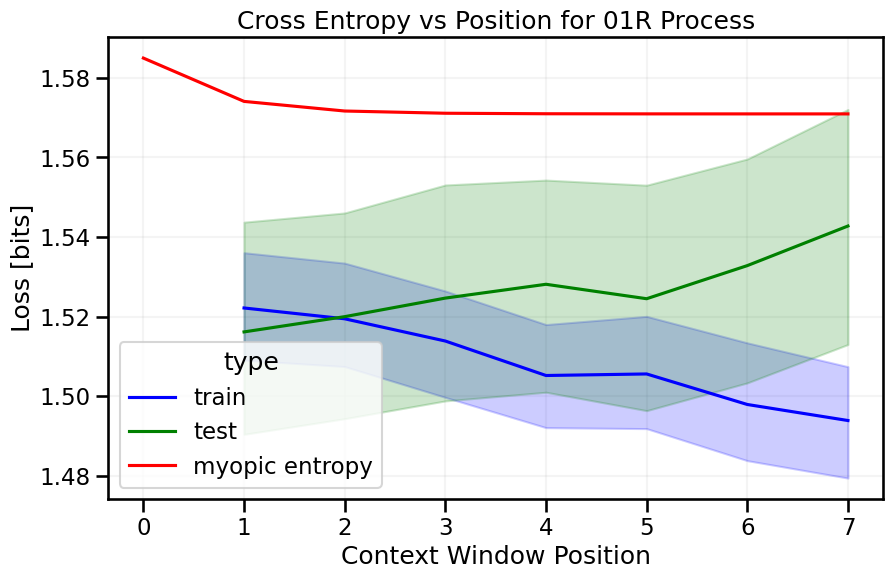

In [29]:
# Compute myopic entropy
myopic_entropy = compute_myopic_entropy_from_MSP(MSP,8)

# Create a DataFrame for myopic entropy
myopic_entropy_df = pd.DataFrame({
    'context_position': np.arange(len(myopic_entropy)),
    'loss': myopic_entropy,
    'type': 'myopic entropy'
})

# Concatenate the dataframes
loss_df = pd.concat([train_loss_df, test_loss_df, myopic_entropy_df])

# Define colors for each line
colors = {'train': 'blue', 'test': 'green', 'myopic entropy': 'red'}

# Plot using seaborn
plt.figure(figsize=(10, 6))
plt.grid(True)  # Add a grid for better readability
# make grid lighter
plt.gca().set_axisbelow(True)
plt.grid(which='major', color='#999999', linestyle='-', alpha=0.1)
sns.lineplot(data=loss_df, x='context_position', y='loss', hue='type', palette=colors)
plt.ylabel('Loss [bits]')
plt.xlabel('Context Window Position')
plt.title('Cross Entropy vs Position for 01R Process')
plt.show()

In [30]:
probs = to_probability_distributions(Z1R.T,8,1e-15)


[[0.7  0.15 0.15]
 [0.15 0.7  0.15]
 [0.15 0.15 0.7 ]]
[0.55 1.   0.55] [[-0.81649658  0.57735027  0.16048579]
 [ 0.40824829  0.57735027 -0.77355612]
 [ 0.40824829  0.57735027  0.61307033]]
[[0.33333333]
 [0.33333333]
 [0.33333333]]


/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



<bound method TernaryAxesSubplot.show of TernaryAxesSubplot: 746105721>

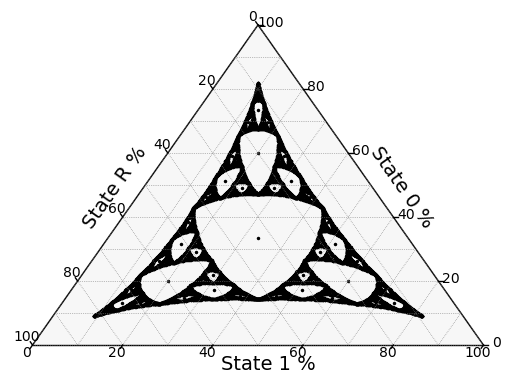

In [31]:
import pandas as pd
import plotly.express as px
import ternary
df = pd.DataFrame([100*p for p in probs], columns=['A', 'B', 'C'])
fig, tax = ternary.figure(scale=100)

# Axis labels. (See below for corner labels.)
fontsize = 14
offset = 0.08
tax.left_axis_label("State R %", fontsize=fontsize, offset=offset)
tax.right_axis_label("State 0 %", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("State 1 %", fontsize=fontsize, offset=-offset)


tax.scatter(df[['A', 'B', 'C']].values, s=1,c='k')
tax.boundary(linewidth=1)
tax.gridlines(multiple=10, color="gray")
tax.ticks(axis='lbr', linewidth=1, multiple=20)
tax.get_axes().axis('off')
tax.show()

In [32]:
# get some training data and run it through the model
from tqdm import tqdm
datas = []
resids = []
for data, target in tqdm(train_loader):
    _, cache = model.run_with_cache(data, names_filter=lambda x: 'resid_post' in x)
    datas.extend(data)
    resids.append(cache["resid_post", model.cfg.n_layers-1])
resids = torch.concat(resids)
print(resids.shape) #(batch, ctx_pos, res_dim)

MSP_states = []
for d in datas:
    this_data = []
    from_state = 0
    for p in d:
        emission = p
        transition_probs = MSP[p,from_state,:]
        # find all nonzero index
        nonzero_indices = np.nonzero(transition_probs)[0]
        #print(nonzero_indices)
        if len(nonzero_indices) != 1:
            print('warning',nonzero_indices)
        from_state = nonzero_indices[0]
        this_data.append(from_state)
    MSP_states.append(this_data)


100%|██████████| 63/63 [00:00<00:00, 83.72it/s]


torch.Size([3994, 7, 64])


In [33]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from collections import Counter


resids_reshaped = resids.view(resids.shape[0]*resids.shape[1], -1)
MSP_states= torch.tensor(MSP_states)
MSP_states_reshaped = MSP_states.view(-1)

state_prob_dict = dict(zip(range(len(probs)),probs))
state_counts = Counter([int(x) for x in MSP_states_reshaped])
print(state_counts)

print(resids_reshaped.shape, MSP_states_reshaped.shape)

# for each of the MSP_states_reshaped, map it to  probs using state_prob_dict
# and weight it according to its frequency of occurrence
target_distributions = np.array([state_prob_dict[int(x)] for x in MSP_states_reshaped])
weights = np.array([state_counts[int(x)] for x in MSP_states_reshaped])
print(target_distributions.shape)


# Initialize MultiOutputRegressor with a LinearRegression model
model = MultiOutputRegressor(LinearRegression())

# Fit the model to your data using the weights
model.fit(resids_reshaped, target_distributions)

# Predict the distributions for new data
predicted_distributions = model.predict(resids_reshaped)


Counter({2: 1899, 1: 1066, 3: 1029, 8: 900, 5: 521, 7: 506, 9: 493, 11: 479, 26: 412, 4: 286, 12: 276, 10: 274, 25: 260, 6: 259, 17: 252, 23: 245, 35: 237, 27: 228, 29: 219, 80: 178, 32: 147, 28: 145, 22: 142, 18: 138, 77: 134, 20: 131, 16: 131, 30: 129, 14: 129, 38: 128, 36: 127, 79: 121, 24: 119, 107: 119, 71: 116, 53: 116, 34: 115, 81: 113, 89: 113, 83: 97, 13: 84, 39: 81, 86: 80, 242: 73, 15: 73, 44: 72, 52: 71, 72: 70, 76: 69, 106: 68, 33: 67, 56: 67, 82: 67, 37: 67, 21: 66, 54: 65, 84: 64, 98: 64, 116: 64, 68: 63, 19: 62, 233: 61, 239: 61, 31: 60, 70: 59, 62: 59, 92: 58, 78: 57, 50: 57, 161: 56, 269: 56, 110: 55, 243: 55, 104: 54, 88: 53, 90: 53, 74: 51, 241: 50, 108: 50, 323: 50, 215: 46, 245: 46, 251: 45, 97: 45, 41: 43, 55: 41, 49: 41, 101: 41, 67: 40, 119: 40, 248: 40, 232: 39, 47: 39, 69: 39, 63: 39, 260: 39, 158: 39, 206: 38, 99: 38, 214: 38, 75: 38, 85: 37, 109: 37, 350: 37, 268: 37, 93: 36, 59: 36, 160: 36, 218: 36, 296: 36, 91: 35, 111: 35, 322: 35, 117: 35, 320: 34, 234

In [34]:
import plotly.express as px
import pandas as pd

# Convert the predicted_distributions and MSP_states_reshaped to a DataFrame
df = pd.DataFrame(np.concatenate((predicted_distributions, MSP_states_reshaped.reshape(-1,1)), axis=1), columns=['x', 'y', 'z', 'label'])
df['label'] = df['label'].astype(str)

# Create a color sequence based on the x, y, z values as RGB
df['color'] = df.apply(lambda row: 'rgb({},{},{})'.format(row['x']*255, row['y']*255, row['z']*255), axis=1)

# Create a 3D scatter plot using plotly express with color based on the RGB values
fig = px.scatter_3d(df, x='x', y='y', z='z', color='color')
fig.show()

# Project the data to the x+y+z=1 plane
df['x_proj'] = df['x'] / (df['x'] + df['y'] + df['z'])
df['y_proj'] = df['y'] / (df['x'] + df['y'] + df['z'])

# Plot the projected data on the 2D plane
# Use the same RGB colorscale
fig = px.scatter(df, x='x_proj', y='y_proj', color='color')
fig.show()


In [35]:
import plotly.graph_objects as go
import pandas as pd

# Convert the predicted_distributions and MSP_states_reshaped to a DataFrame
df = pd.DataFrame(np.concatenate((predicted_distributions, MSP_states_reshaped.reshape(-1,1)), axis=1), columns=['x', 'y', 'z', 'label'])
df['label'] = df['label'].astype(str)

# Create a color sequence based on the x, y, z values as RGB
df['color'] = df.apply(lambda row: 'rgb({},{},{})'.format(int(row['x']*255), int(row['y']*255), int(row['z']*255)), axis=1)

# Create a 3D scatter plot using plotly graph_objects with color based on the RGB values
fig = go.Figure(data=[go.Scatter3d(x=df['x'], y=df['y'], z=df['z'], mode='markers', marker=dict(color=df['color']))])
fig.show()

# Project the data to the x+y+z=1 plane
df['x_proj'] = df['x'] / (df['x'] + df['y'] + df['z'])
df['y_proj'] = df['y'] / (df['x'] + df['y'] + df['z'])

# Plot the projected data on the 2D plane
# Use the same RGB colorscale
fig = go.Figure(data=[go.Scatter(x=df['x_proj'], y=df['y_proj'], mode='markers', marker=dict(color=df['color']))])
fig.show()

ValueError: 
    Invalid element(s) received for the 'color' property of scatter3d.marker
        Invalid elements include: ['rgb(44,221,-10)', 'rgb(44,221,-10)', 'rgb(176,-1,79)', 'rgb(22,248,-16)', 'rgb(235,-4,23)', 'rgb(4,252,-1)', 'rgb(4,252,-1)', 'rgb(181,-4,77)', 'rgb(44,221,-10)', 'rgb(176,-1,79)']

    The 'color' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color:
            aliceblue, antiquewhite, aqua, aquamarine, azure,
            beige, bisque, black, blanchedalmond, blue,
            blueviolet, brown, burlywood, cadetblue,
            chartreuse, chocolate, coral, cornflowerblue,
            cornsilk, crimson, cyan, darkblue, darkcyan,
            darkgoldenrod, darkgray, darkgrey, darkgreen,
            darkkhaki, darkmagenta, darkolivegreen, darkorange,
            darkorchid, darkred, darksalmon, darkseagreen,
            darkslateblue, darkslategray, darkslategrey,
            darkturquoise, darkviolet, deeppink, deepskyblue,
            dimgray, dimgrey, dodgerblue, firebrick,
            floralwhite, forestgreen, fuchsia, gainsboro,
            ghostwhite, gold, goldenrod, gray, grey, green,
            greenyellow, honeydew, hotpink, indianred, indigo,
            ivory, khaki, lavender, lavenderblush, lawngreen,
            lemonchiffon, lightblue, lightcoral, lightcyan,
            lightgoldenrodyellow, lightgray, lightgrey,
            lightgreen, lightpink, lightsalmon, lightseagreen,
            lightskyblue, lightslategray, lightslategrey,
            lightsteelblue, lightyellow, lime, limegreen,
            linen, magenta, maroon, mediumaquamarine,
            mediumblue, mediumorchid, mediumpurple,
            mediumseagreen, mediumslateblue, mediumspringgreen,
            mediumturquoise, mediumvioletred, midnightblue,
            mintcream, mistyrose, moccasin, navajowhite, navy,
            oldlace, olive, olivedrab, orange, orangered,
            orchid, palegoldenrod, palegreen, paleturquoise,
            palevioletred, papayawhip, peachpuff, peru, pink,
            plum, powderblue, purple, red, rosybrown,
            royalblue, rebeccapurple, saddlebrown, salmon,
            sandybrown, seagreen, seashell, sienna, silver,
            skyblue, slateblue, slategray, slategrey, snow,
            springgreen, steelblue, tan, teal, thistle, tomato,
            turquoise, violet, wheat, white, whitesmoke,
            yellow, yellowgreen
      - A number that will be interpreted as a color
        according to scatter3d.marker.colorscale
      - A list or array of any of the above

In [18]:
probs_to_plot = np.array([np.array(x) for x in probs])
df_probs = pd.DataFrame(probs_to_plot, columns=['x', 'y', 'z'])
df_probs['label'] = [str(x) for x in range(len(probs_to_plot))]

fig = px.scatter_3d(df_probs, x='x', y='y', z='z', color='label', color_discrete_sequence=px.colors.qualitative.Plotly)
fig.show()

df_probs['x_proj'] = df_probs['x'] / (df_probs['x'] + df_probs['y'] + df_probs['z'])
df_probs['y_proj'] = df_probs['y'] / (df_probs['x'] + df_probs['y'] + df_probs['z'])

fig = px.scatter(df_probs, x='x_proj', y='y_proj', color='label', color_discrete_sequence=px.colors.qualitative.Plotly)
fig.show()


/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



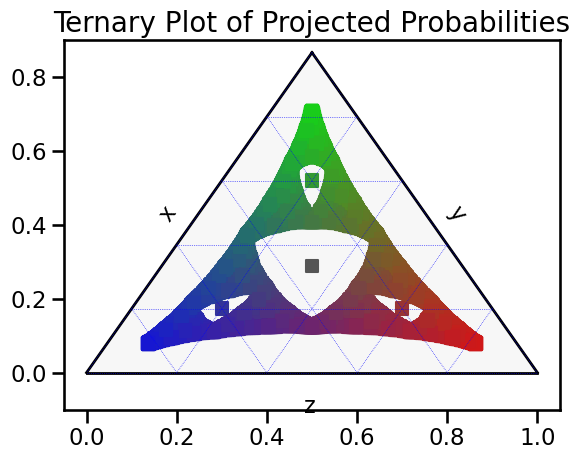

In [19]:
import ternary

# Create a ternary plot
figure, tax = ternary.figure(scale=1.0)
tax.boundary(linewidth=2.0)
tax.gridlines(multiple=0.2, color="blue")

# Plot the data with color based on the x, y, z values acting as RGB
colors = df_probs.apply(lambda row: [row['x'], row['y'], row['z']], axis=1)
tax.scatter(df_probs[['x', 'y', 'z']].values, marker='s', c=colors.tolist(), label="Projected Probabilities")

# Set labels and title
tax.set_title("Ternary Plot of Projected Probabilities", fontsize=20)
tax.left_axis_label("x", fontsize=16)
tax.right_axis_label("y", fontsize=16)
tax.bottom_axis_label("z", fontsize=16)

# Show the plot
tax.show()


/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



<bound method TernaryAxesSubplot.show of TernaryAxesSubplot: 745078621>

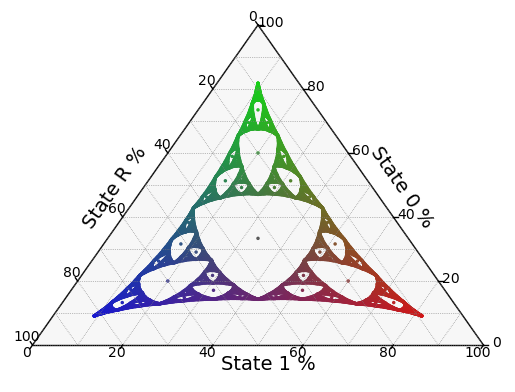

In [20]:
import pandas as pd
import plotly.express as px
import ternary
df = pd.DataFrame([100*p for p in probs], columns=['0', '1', 'R'])
df['label'] = [str(x) for x in range(len(probs))]
fig, tax = ternary.figure(scale=100)

# Axis labels. (See below for corner labels.)
fontsize = 14
offset = 0.08
tax.left_axis_label("State R %", fontsize=fontsize, offset=offset)
tax.right_axis_label("State 0 %", fontsize=fontsize, offset=offset)
tax.bottom_axis_label("State 1 %", fontsize=fontsize, offset=-offset)

# Add colors and legend
colors = df_probs.apply(lambda row: [row['x'], row['y'], row['z']], axis=1)

tax.scatter(df[['0', '1', 'R']].values, c=colors, label="Projected Probabilities",s=1)


tax.boundary(linewidth=1)
tax.gridlines(multiple=10, color="gray")
tax.ticks(axis='lbr', linewidth=1, multiple=20)
tax.get_axes().axis('off')
tax.show

In [41]:
df


,0,1,R,label
0,33.333333,33.333333,33.333333,0
1,60.000000,20.000000,20.000000,1
2,20.000000,60.000000,20.000000,2
3,20.000000,20.000000,60.000000,3
4,73.469388,13.265306,13.265306,4
...,...,...,...,...
9836,12.904408,65.349181,21.746411,9836
9837,12.913874,21.799039,65.287087,9837
9838,42.874410,14.291470,42.834120,9838
9839,14.291470,42.874410,42.834120,9839


In [42]:
import ternary

# Convert the predicted_distributions and MSP_states_reshaped to a DataFrame
df = pd.DataFrame(np.concatenate((predicted_distributions, MSP_states_reshaped.reshape(-1,1)), axis=1), columns=['x', 'y', 'z', 'label'])
df[['x', 'y', 'z']] = df[['x', 'y', 'z']] * 100

df['label'] = df['label'].astype(int).astype(str)


# Create a color sequence based on the unique labels in ascending order
color_sequence = px.colors.qualitative.Plotly[:len(df['label'].unique())]

# Create a ternary plot using the ternary library
cpred = np.clip(predicted_distributions, 0, 1)
colors = [list(p) for p in cpred]
fig, tax = ternary.figure(scale=100)
tax.scatter(df[['x', 'y', 'z']].values, color=colors, label="Projected Probabilities",s=1)
tax.boundary(linewidth=1)
tax.gridlines(multiple=10, color="gray")
tax.ticks(axis='lbr', linewidth=1, multiple=20)
tax.get_axes().axis('off')
tax.show()


NameError: name 'predicted_distributions' is not defined

In [ ]:
np.where(np.array(colors)<0)


(array([], dtype=int64), array([], dtype=int64))

/Users/adamimos/anaconda3/envs/epsilon-machine/lib/python3.11/site-packages/ternary/plotting.py:148: UserWarning:

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored



KeyError: "None of [Index(['x', 'y', 'z'], dtype='object')] are in the [columns]"

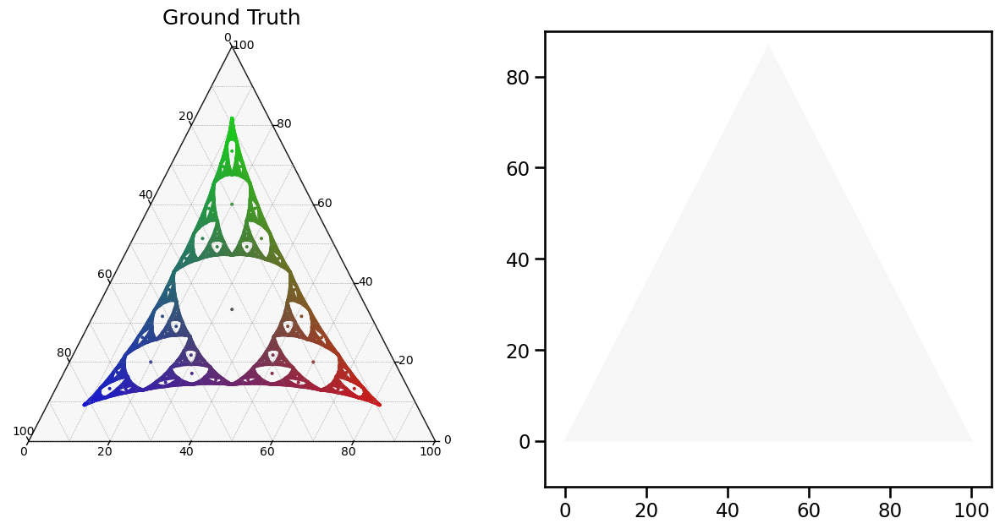

In [22]:
import matplotlib.pyplot as plt

# Create a new figure
fig = plt.figure(figsize=(15, 7))

# Add first subplot for the first ternary plot
ax1 = fig.add_subplot(121)

# Create a ternary plot in the first subplot
tax1 = ternary.TernaryAxesSubplot(ax=ax1, scale=100)
df2 = pd.DataFrame([100*p for p in probs], columns=['0', '1', 'R'])
df2['label'] = [str(x) for x in range(len(probs))]
tax1.scatter(df2[['0', '1', 'R']].values, color=
             df_probs.apply(lambda row: [row['x'], row['y'], row['z']], axis=1),
             label="Projected Probabilities",s=2)
tax1.boundary(linewidth=1)
tax1.gridlines(multiple=10, color="gray")
tax1.ticks(axis='lbr', linewidth=1, multiple=20)
tax1.get_axes().axis('off')
tax1.set_title("Ground Truth")  # Add title to the first plot

# Add second subplot for the second ternary plot
ax2 = fig.add_subplot(122)

# Create a ternary plot in the second subplot
tax2 = ternary.TernaryAxesSubplot(ax=ax2, scale=100)
colors = [list(state_prob_dict[int(x)]) for x in MSP_states_reshaped]
tax2.scatter(df[['x', 'y', 'z']].values, color=colors,s=2)
tax2.gridlines(multiple=10, color="gray")
tax2.ticks(axis='lbr', linewidth=1, multiple=20)
tax2.get_axes().axis('off')
tax2.set_title("Residual Stream")  # Add title to the second plot

# Show the figure with the two ternary plots side by side
plt.show()




In [ ]:
MSP_states_reshaped
state_prob_dict



[array([0.6, 0.2, 0.2]),
 array([0.31578947, 0.51315789, 0.17105263]),
 array([0.17360621, 0.69548342, 0.13091037]),
 array([0.11887634, 0.77361892, 0.10750474]),
 array([0.15186405, 0.40577352, 0.44236243]),
 array([0.13372183, 0.64106608, 0.22521209]),
 array([0.2, 0.6, 0.2]),
 array([0.51315789, 0.31578947, 0.17105263]),
 array([0.26238019, 0.58945687, 0.14816294]),
 array([0.20117108, 0.32413398, 0.47469495]),
 array([0.15734177, 0.5945022 , 0.24815603]),
 array([0.1503765 , 0.30323256, 0.54639094]),
 array([0.6, 0.2, 0.2]),
 array([0.31578947, 0.17105263, 0.51315789]),
 array([0.58945687, 0.14816294, 0.26238019]),
 array([0.32413398, 0.47469495, 0.20117108]),
 array([0.21578665, 0.27021982, 0.51399352]),
 array([0.14403543, 0.16008472, 0.69587985]),
 array([0.2, 0.6, 0.2]),
 array([0.17105263, 0.31578947, 0.51315789]),
 array([0.14816294, 0.58945687, 0.26238019]),
 array([0.11880995, 0.73013856, 0.15105149]),
 array([0.14687754, 0.37620551, 0.47691695]),
 array([0.47370305, 0.2441